In [1]:
import matplotlib.pyplot as plt
import pandas
import scipy.io
import numpy
from scipy.signal import spectrogram
import os
import pprint 
import numpy.fft

%matplotlib notebook

In [3]:
dog_1_files = "/media/rohan/My Stuff/EEG/Dog_1/"
files = sorted(os.listdir(dog_1_files))[1:]
print (files)

['Dog_1_interictal_segment_0001.mat', 'Dog_1_interictal_segment_0002.mat', 'Dog_1_interictal_segment_0003.mat', 'Dog_1_interictal_segment_0004.mat', 'Dog_1_interictal_segment_0005.mat', 'Dog_1_interictal_segment_0006.mat', 'Dog_1_interictal_segment_0007.mat', 'Dog_1_interictal_segment_0008.mat', 'Dog_1_interictal_segment_0009.mat', 'Dog_1_interictal_segment_0010.mat', 'Dog_1_interictal_segment_0011.mat', 'Dog_1_interictal_segment_0012.mat', 'Dog_1_interictal_segment_0013.mat', 'Dog_1_interictal_segment_0014.mat', 'Dog_1_interictal_segment_0015.mat', 'Dog_1_interictal_segment_0016.mat', 'Dog_1_interictal_segment_0017.mat', 'Dog_1_interictal_segment_0018.mat', 'Dog_1_interictal_segment_0019.mat', 'Dog_1_interictal_segment_0020.mat', 'Dog_1_interictal_segment_0021.mat', 'Dog_1_interictal_segment_0022.mat', 'Dog_1_interictal_segment_0023.mat', 'Dog_1_interictal_segment_0024.mat', 'Dog_1_interictal_segment_0025.mat', 'Dog_1_interictal_segment_0026.mat', 'Dog_1_interictal_segment_0027.mat', 

In [4]:
matFile = scipy.io.loadmat(dog_1_files+files[43])
pp = pprint.PrettyPrinter(indent=4)
print (matFile.keys())
pp.pprint (matFile['interictal_segment_44'][0][0])

dict_keys(['__version__', 'interictal_segment_44', '__header__', '__globals__'])
(array([[ 24,   7,  -2, ...,  61, -45,  28],
       [  3,  -5, -11, ...,   5,  18,  27],
       [ -2,  -2, -19, ..., -53,  20, -29],
       ..., 
       [  7,   2,   3, ...,  -9,  18, -24],
       [  3,  14,  23, ..., -59,  20, -55],
       [ -4,  20,  36, ...,  27, -59,  35]], dtype=int16), array([[600]], dtype=uint16), array([[ 399.6097561]]), array([[array(['NVC1202_32_002_Ecog_c001'],
      dtype='<U24'),
        array(['NVC1202_32_002_Ecog_c002'],
      dtype='<U24'),
        array(['NVC1202_32_002_Ecog_c003'],
      dtype='<U24'),
        array(['NVC1202_32_002_Ecog_c004'],
      dtype='<U24'),
        array(['NVC1202_32_002_Ecog_c005'],
      dtype='<U24'),
        array(['NVC1202_32_002_Ecog_c006'],
      dtype='<U24'),
        array(['NVC1202_32_002_Ecog_c007'],
      dtype='<U24'),
        array(['NVC1202_32_002_Ecog_c008'],
      dtype='<U24'),
        array(['NVC1202_32_002_Ecog_c009'],
      d

In [5]:
pp.pprint (matFile)

{   '__globals__': [],
    '__header__': b'MATLAB 5.0 MAT-file, Platform: MACI64, Created on: Thu A'
                  b'ug 21 01:00:00 2014',
    '__version__': '1.0',
    'interictal_segment_44': array([[ (array([[ 24,   7,  -2, ...,  61, -45,  28],
       [  3,  -5, -11, ...,   5,  18,  27],
       [ -2,  -2, -19, ..., -53,  20, -29],
       ..., 
       [  7,   2,   3, ...,  -9,  18, -24],
       [  3,  14,  23, ..., -59,  20, -55],
       [ -4,  20,  36, ...,  27, -59,  35]], dtype=int16), array([[600]], dtype=uint16), array([[ 399.6097561]]), array([[array(['NVC1202_32_002_Ecog_c001'],
      dtype='<U24'),
        array(['NVC1202_32_002_Ecog_c002'],
      dtype='<U24'),
        array(['NVC1202_32_002_Ecog_c003'],
      dtype='<U24'),
        array(['NVC1202_32_002_Ecog_c004'],
      dtype='<U24'),
        array(['NVC1202_32_002_Ecog_c005'],
      dtype='<U24'),
        array(['NVC1202_32_002_Ecog_c006'],
      dtype='<U24'),
        array(['NVC1202_32_002_Ecog_c007'],
      dtype

In [6]:
print (matFile['interictal_segment_44'][0][0][0].shape)

(16, 239766)


The data is arranged as 16 rows representing the 16 electrodes, and 239766 columns. The sampling frequency is 399.6097561 Hz. The duration of the clip is 10 minutes (600 seconds). So the number of columns is given by 399.6097561 * 600 = 239766.

The data is divided into segments. E.g. Segment_6 is sequence 6 and it represents the iEEG data from 50 to 60 minutes.

In [7]:
file = matFile['interictal_segment_44'][0][0][0]
electrode1 = file[2]

<IPython.core.display.Javascript object>


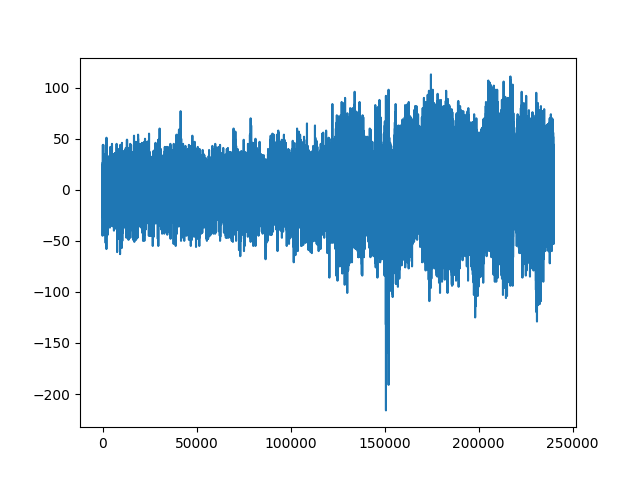

In [10]:
plt.plot(electrode1)
plt.savefig('Raw Data.png', transparent=False)
plt.show()

In [13]:
data_fft = numpy.fft.fft(electrode1) # take the fft of the signal 

<IPython.core.display.Javascript object>


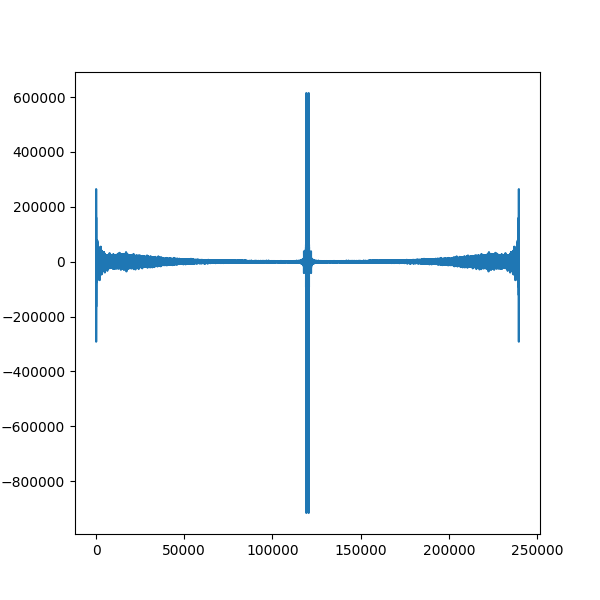

/home/rohan/.virtualenvs/tensorflow/lib/python3.5/site-packages/numpy/core/numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


In [14]:
plt.figure(figsize=(6,6))
plt.plot(data_fft)
plt.savefig("After FFT.png")
plt.show()

<IPython.core.display.Javascript object>


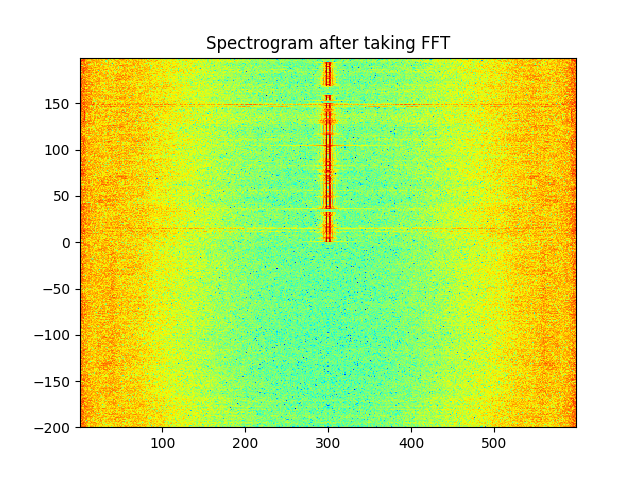

In [48]:
Pxx, freqs, bins, im = plt.specgram(data_fft, NFFT=1024, Fs=399.6097561, noverlap=512, cmap=plt.cm.jet)
plt.title('Spectrogram after taking FFT')
plt.savefig('')

<IPython.core.display.Javascript object>


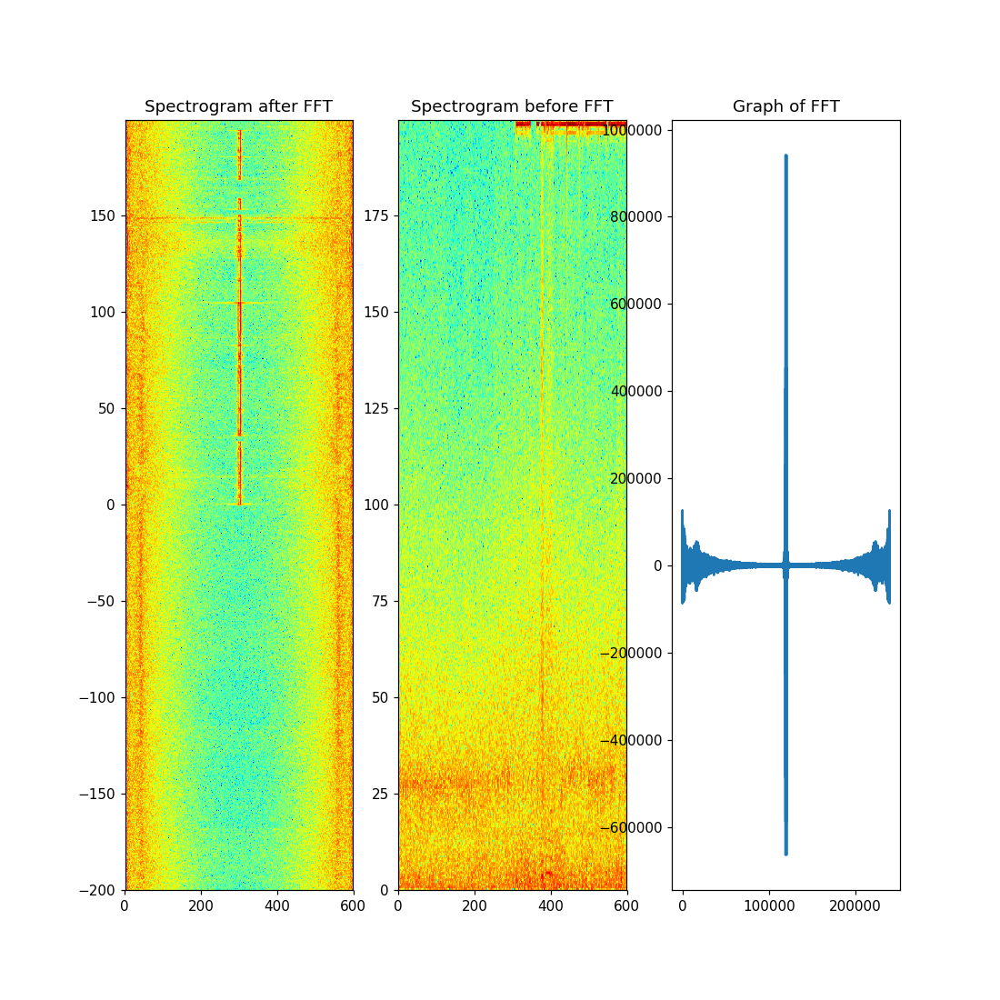

/home/rohan/.virtualenvs/tensorflow/lib/python3.5/site-packages/numpy/core/numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


In [93]:
#Electrode 1
electrode = file[0]
plt.figure(figsize=(10,10))
fft = numpy.fft.fft(electrode)
plt.subplot(131)
Pxx, freqs, bins, im = plt.specgram(fft, NFFT=1024, Fs=399.6097561, noverlap=512, cmap=plt.cm.jet)
plt.title('Spectrogram after FFT')
plt.subplot(132)
plt.title('Spectrogram before FFT')
Pxx, freqs, bins, im = plt.specgram(electrode1, NFFT=1024, Fs=399.6097561, noverlap=512, cmap=plt.cm.jet)
plt.subplot(133)
plt.plot(fft)
plt.title('Graph of FFT')

In [16]:
Pxx, freqs, bins, im = plt.specgram(fft, NFFT=1024, Fs=399.6097561, noverlap=512, cmap=plt.cm.jet)
plt.savefig("Specgram after fft")

NameError: name 'fft' is not defined

<IPython.core.display.Javascript object>


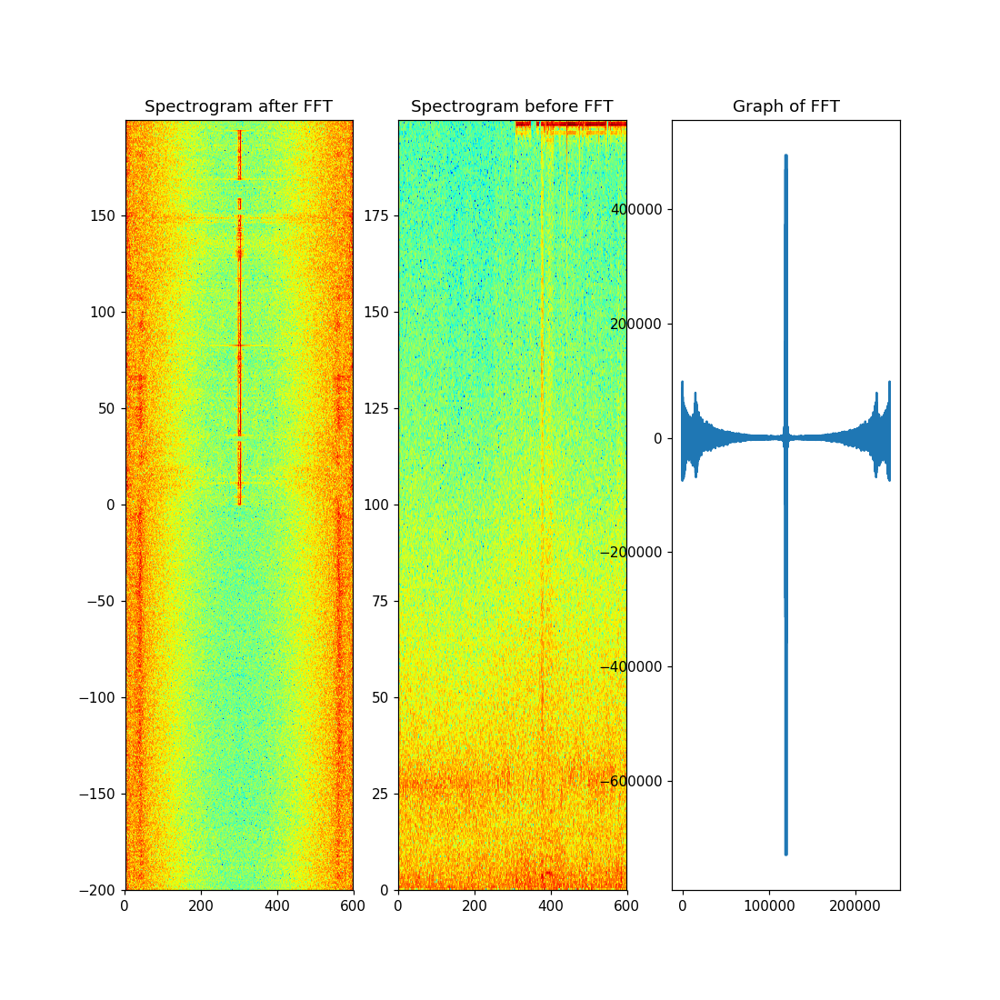

/home/rohan/.virtualenvs/tensorflow/lib/python3.5/site-packages/numpy/core/numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


In [94]:
#Electrode 2
electrode = file[1]
plt.figure(figsize=(10,10))
fft = numpy.fft.fft(electrode)
plt.subplot(131)
Pxx, freqs, bins, im = plt.specgram(fft, NFFT=1024, Fs=399.6097561, noverlap=512, cmap=plt.cm.jet)
plt.title('Spectrogram after FFT')
plt.subplot(132)
plt.title('Spectrogram before FFT')
Pxx, freqs, bins, im = plt.specgram(electrode1, NFFT=1024, Fs=399.6097561, noverlap=512, cmap=plt.cm.jet)
plt.subplot(133)
plt.plot(fft)
plt.title('Graph of FFT')

<IPython.core.display.Javascript object>


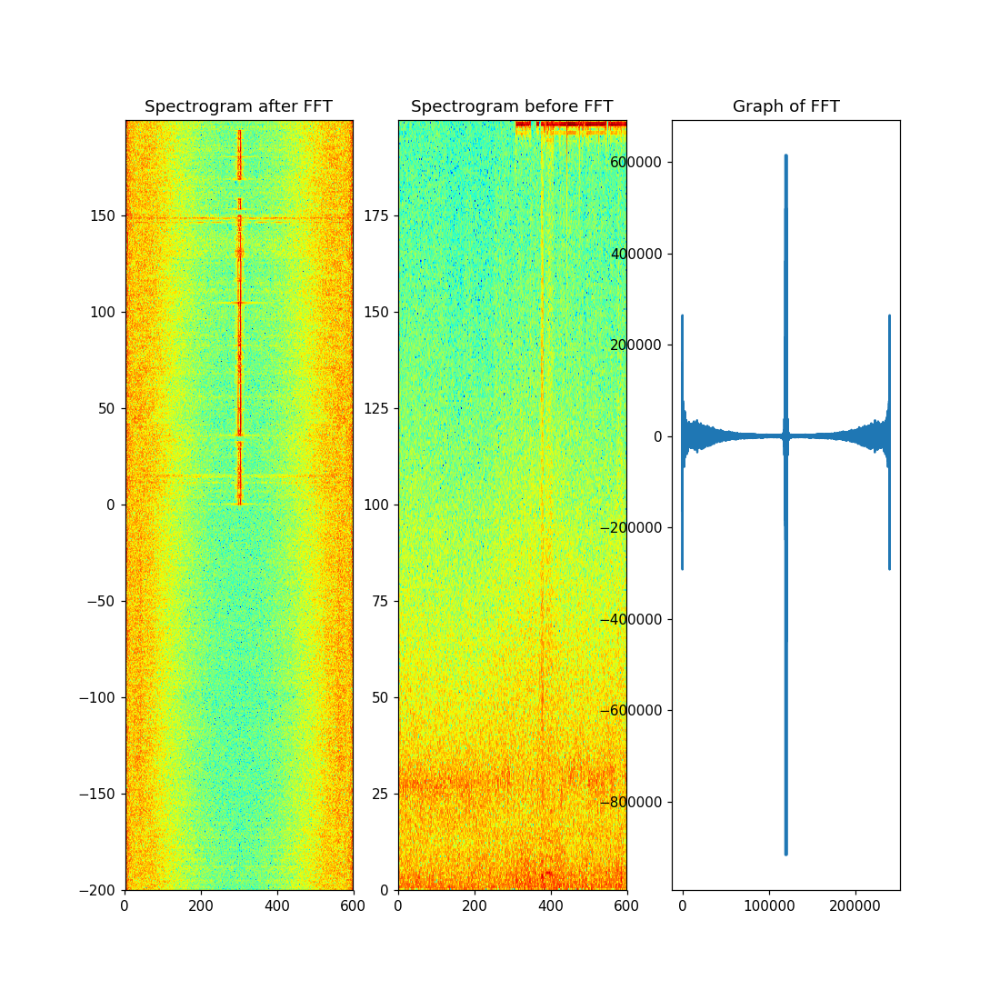

/home/rohan/.virtualenvs/tensorflow/lib/python3.5/site-packages/numpy/core/numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


In [95]:
#Electrode 3
electrode = file[2]
plt.figure(figsize=(10,10))
fft = numpy.fft.fft(electrode)
plt.subplot(131)
Pxx, freqs, bins, im = plt.specgram(fft, NFFT=1024, Fs=399.6097561, noverlap=512, cmap=plt.cm.jet)
plt.title('Spectrogram after FFT')
plt.subplot(132)
plt.title('Spectrogram before FFT')
Pxx, freqs, bins, im = plt.specgram(electrode1, NFFT=1024, Fs=399.6097561, noverlap=512, cmap=plt.cm.jet)
plt.subplot(133)
plt.plot(fft)
plt.title('Graph of FFT')

<IPython.core.display.Javascript object>


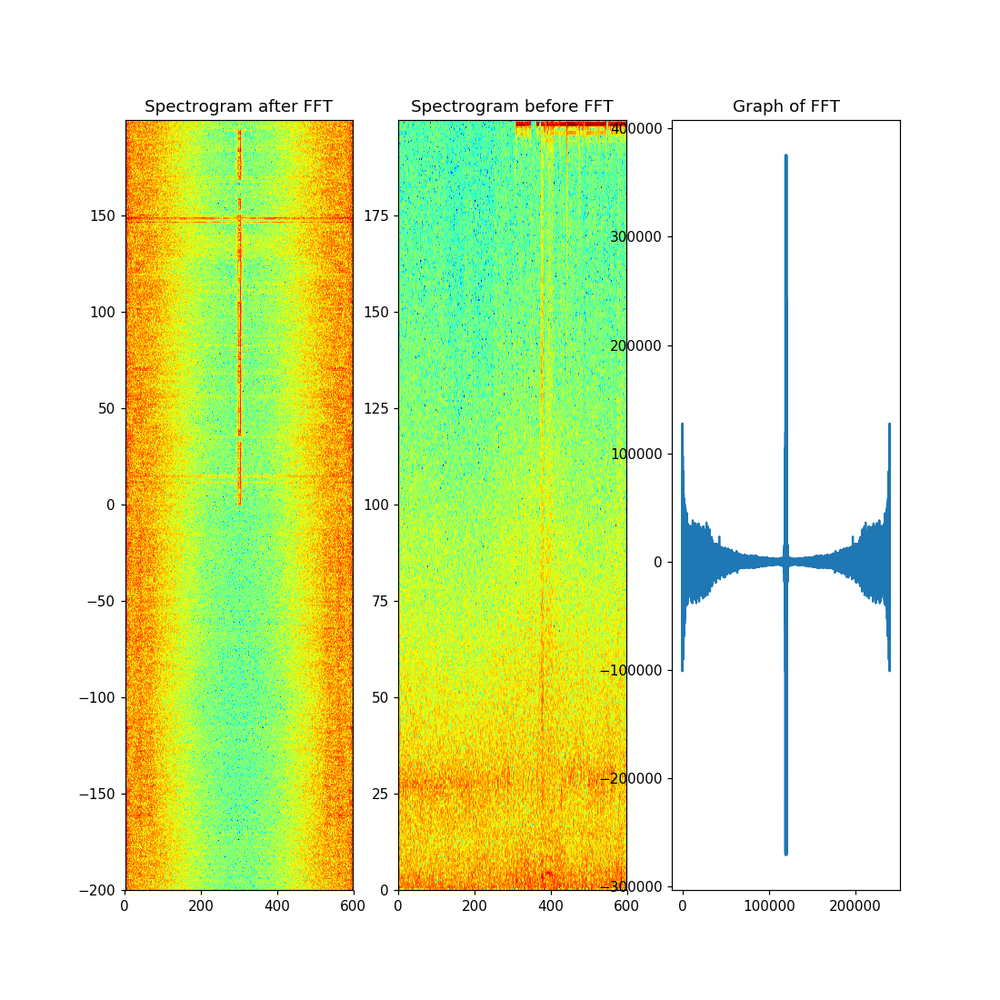

/home/rohan/.virtualenvs/tensorflow/lib/python3.5/site-packages/numpy/core/numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


In [96]:
#Electrode 4
electrode = file[3]
plt.figure(figsize=(10,10))
fft = numpy.fft.fft(electrode)
plt.subplot(131)
Pxx, freqs, bins, im = plt.specgram(fft, NFFT=1024, Fs=399.6097561, noverlap=512, cmap=plt.cm.jet)
plt.title('Spectrogram after FFT')
plt.subplot(132)
plt.title('Spectrogram before FFT')
Pxx, freqs, bins, im = plt.specgram(electrode1, NFFT=1024, Fs=399.6097561, noverlap=512, cmap=plt.cm.jet)
plt.subplot(133)
plt.plot(fft)
plt.title('Graph of FFT')

<IPython.core.display.Javascript object>


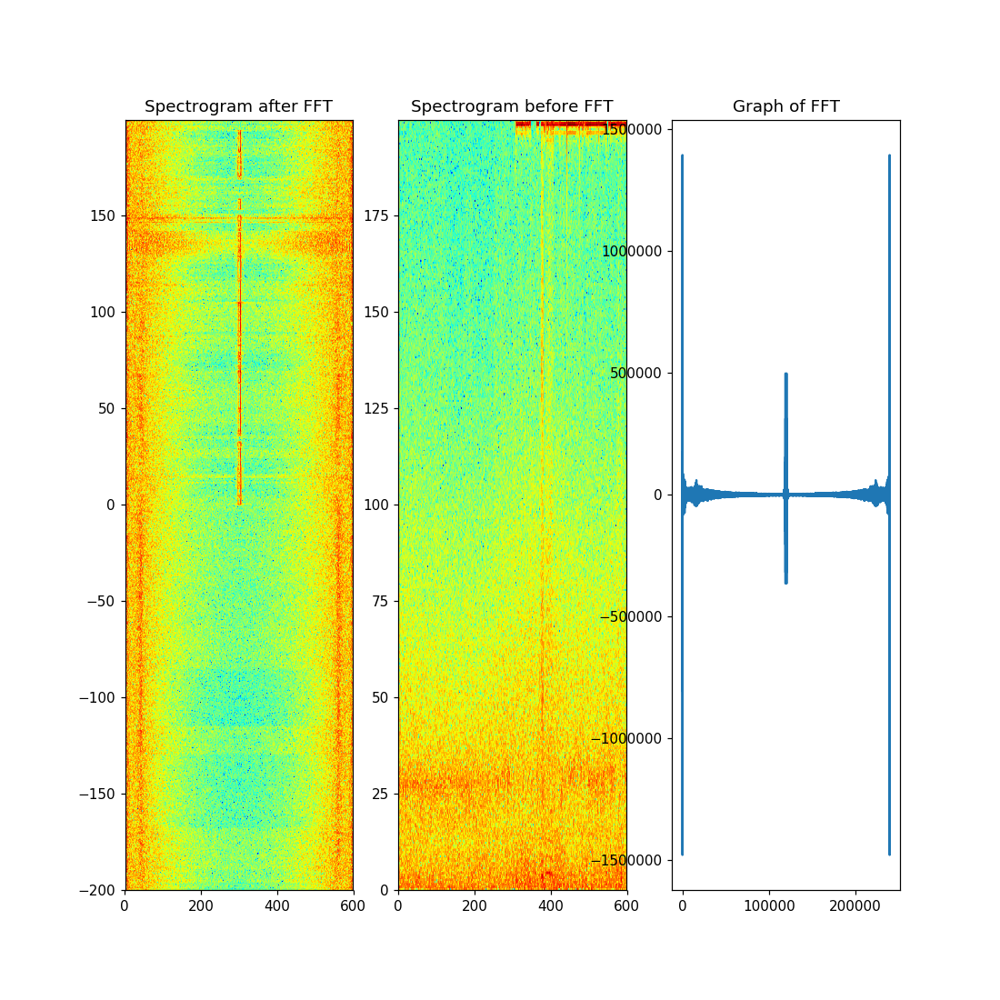

/home/rohan/.virtualenvs/tensorflow/lib/python3.5/site-packages/numpy/core/numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


In [97]:
#Electrode 5
electrode = file[4]
plt.figure(figsize=(10,10))
fft = numpy.fft.fft(electrode)
plt.subplot(131)
Pxx, freqs, bins, im = plt.specgram(fft, NFFT=1024, Fs=399.6097561, noverlap=512, cmap=plt.cm.jet)
plt.title('Spectrogram after FFT')
plt.subplot(132)
plt.title('Spectrogram before FFT')
Pxx, freqs, bins, im = plt.specgram(electrode1, NFFT=1024, Fs=399.6097561, noverlap=512, cmap=plt.cm.jet)
plt.subplot(133)
plt.plot(fft)
plt.title('Graph of FFT')

<IPython.core.display.Javascript object>


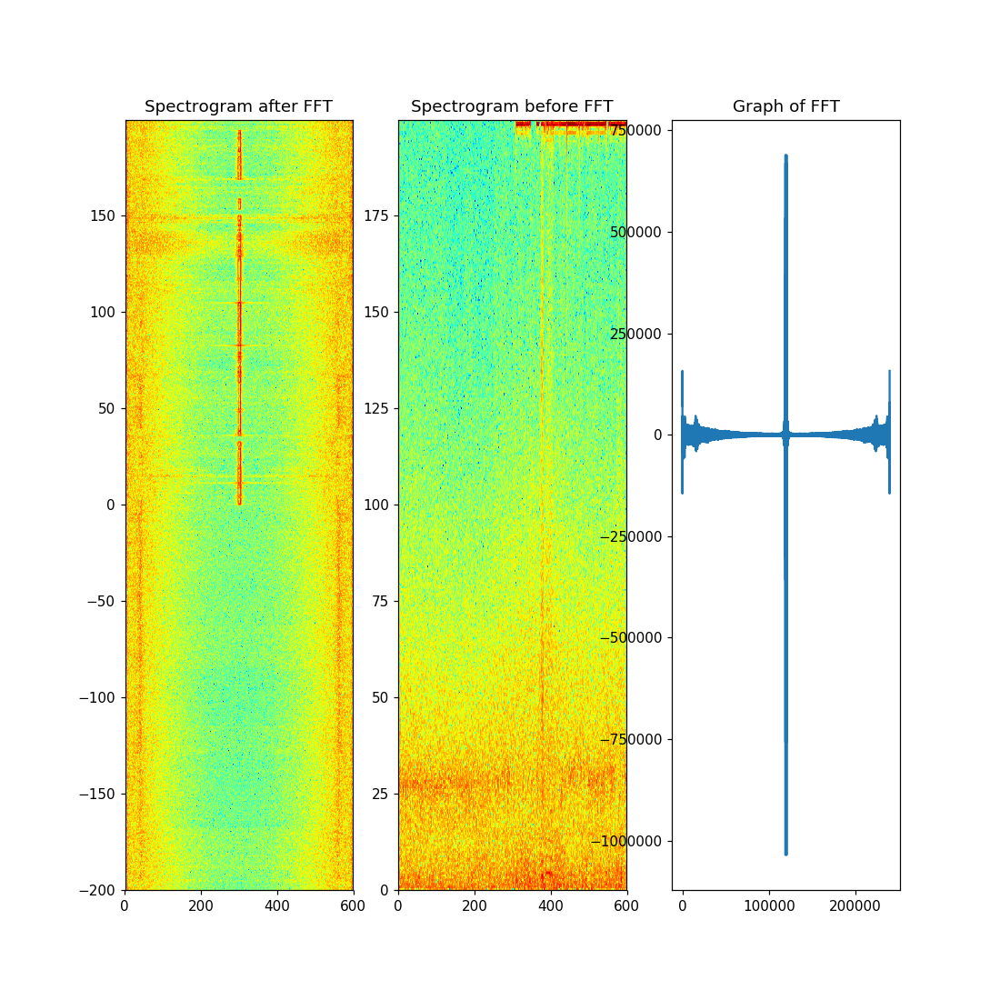

/home/rohan/.virtualenvs/tensorflow/lib/python3.5/site-packages/numpy/core/numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


In [98]:
#Electrode 6
electrode = file[5]
plt.figure(figsize=(10,10))
fft = numpy.fft.fft(electrode)
plt.subplot(131)
Pxx, freqs, bins, im = plt.specgram(fft, NFFT=1024, Fs=399.6097561, noverlap=512, cmap=plt.cm.jet)
plt.title('Spectrogram after FFT')
plt.subplot(132)
plt.title('Spectrogram before FFT')
Pxx, freqs, bins, im = plt.specgram(electrode1, NFFT=1024, Fs=399.6097561, noverlap=512, cmap=plt.cm.jet)
plt.subplot(133)
plt.plot(fft)
plt.title('Graph of FFT')

<IPython.core.display.Javascript object>


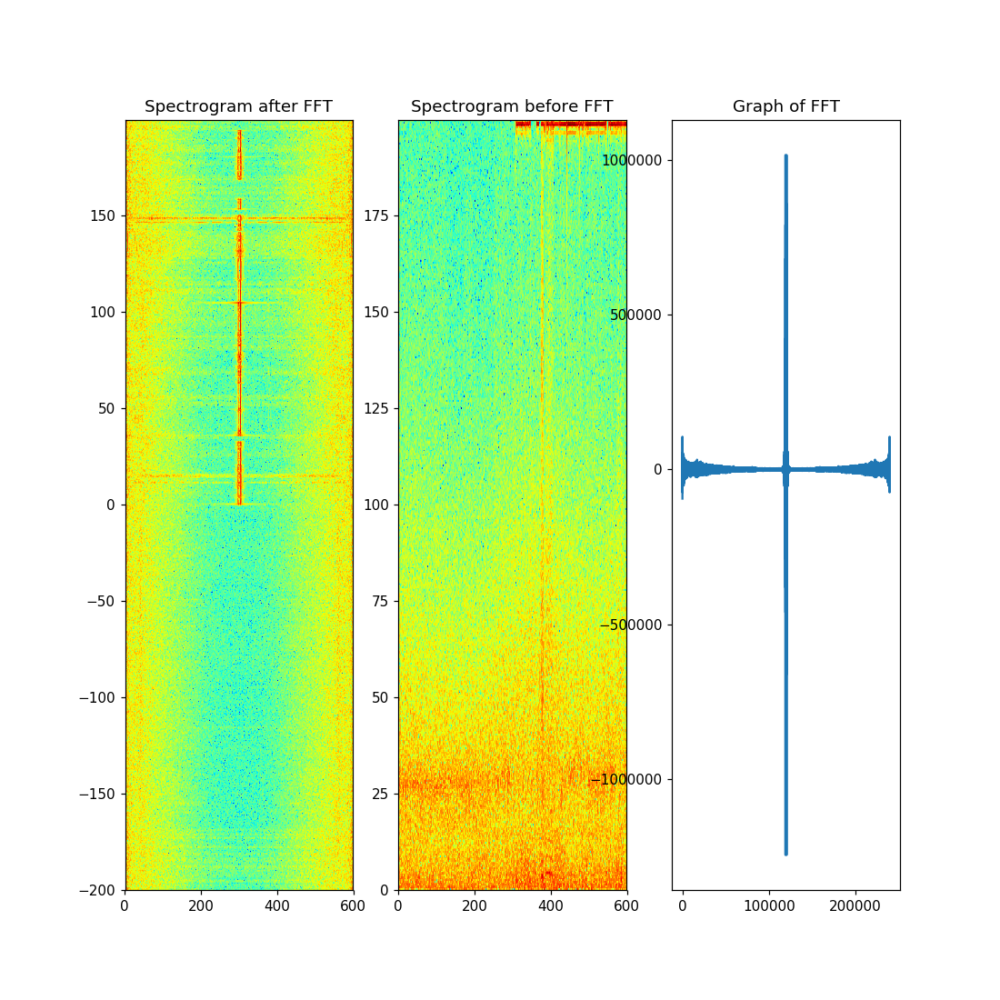

/home/rohan/.virtualenvs/tensorflow/lib/python3.5/site-packages/numpy/core/numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


In [99]:
#Electrode 7
electrode = file[6]
plt.figure(figsize=(10,10))
fft = numpy.fft.fft(electrode)
plt.subplot(131)
Pxx, freqs, bins, im = plt.specgram(fft, NFFT=1024, Fs=399.6097561, noverlap=512, cmap=plt.cm.jet)
plt.title('Spectrogram after FFT')
plt.subplot(132)
plt.title('Spectrogram before FFT')
Pxx, freqs, bins, im = plt.specgram(electrode1, NFFT=1024, Fs=399.6097561, noverlap=512, cmap=plt.cm.jet)
plt.subplot(133)
plt.plot(fft)
plt.title('Graph of FFT')

<IPython.core.display.Javascript object>


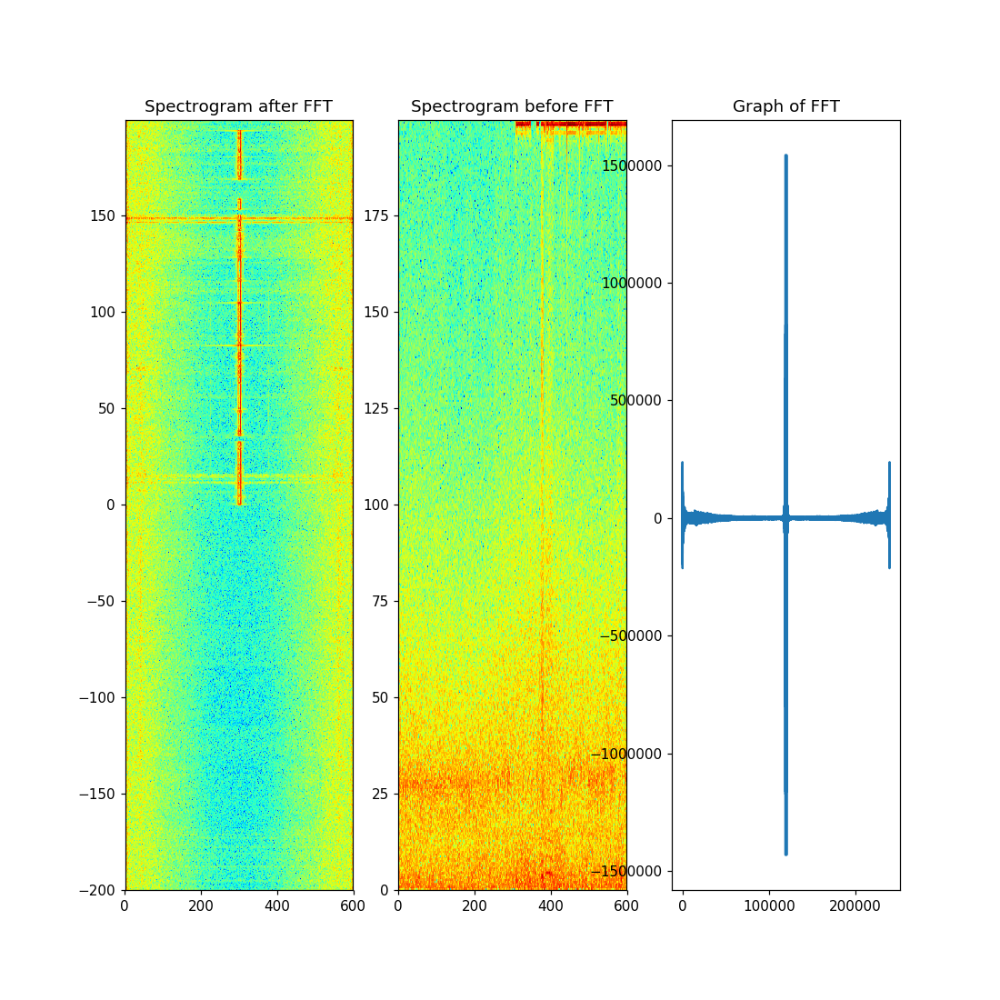

/home/rohan/.virtualenvs/tensorflow/lib/python3.5/site-packages/numpy/core/numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


In [101]:
#Electrode 8
electrode = file[7]
plt.figure(figsize=(10,10))
fft = numpy.fft.fft(electrode)
plt.subplot(131)
Pxx, freqs, bins, im = plt.specgram(fft, NFFT=1024, Fs=399.6097561, noverlap=512, cmap=plt.cm.jet)
plt.title('Spectrogram after FFT')
plt.subplot(132)
plt.title('Spectrogram before FFT')
Pxx, freqs, bins, im = plt.specgram(electrode1, NFFT=1024, Fs=399.6097561, noverlap=512, cmap=plt.cm.jet)
plt.subplot(133)
plt.plot(fft)
plt.title('Graph of FFT')

<IPython.core.display.Javascript object>


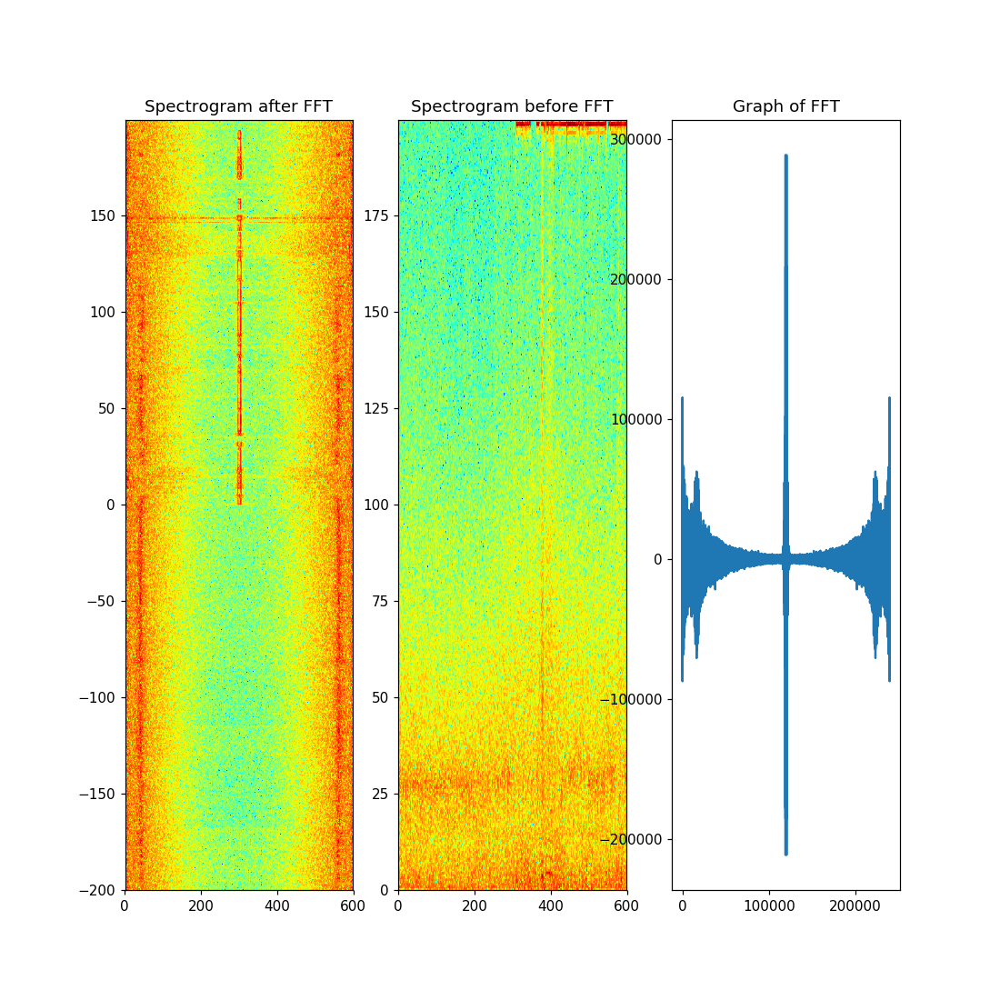

/home/rohan/.virtualenvs/tensorflow/lib/python3.5/site-packages/numpy/core/numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


In [102]:
#Electrode 9
electrode = file[8]
plt.figure(figsize=(10,10))
fft = numpy.fft.fft(electrode)
plt.subplot(131)
Pxx, freqs, bins, im = plt.specgram(fft, NFFT=1024, Fs=399.6097561, noverlap=512, cmap=plt.cm.jet)
plt.title('Spectrogram after FFT')
plt.subplot(132)
plt.title('Spectrogram before FFT')
Pxx, freqs, bins, im = plt.specgram(electrode1, NFFT=1024, Fs=399.6097561, noverlap=512, cmap=plt.cm.jet)
plt.subplot(133)
plt.plot(fft)
plt.title('Graph of FFT')

<IPython.core.display.Javascript object>


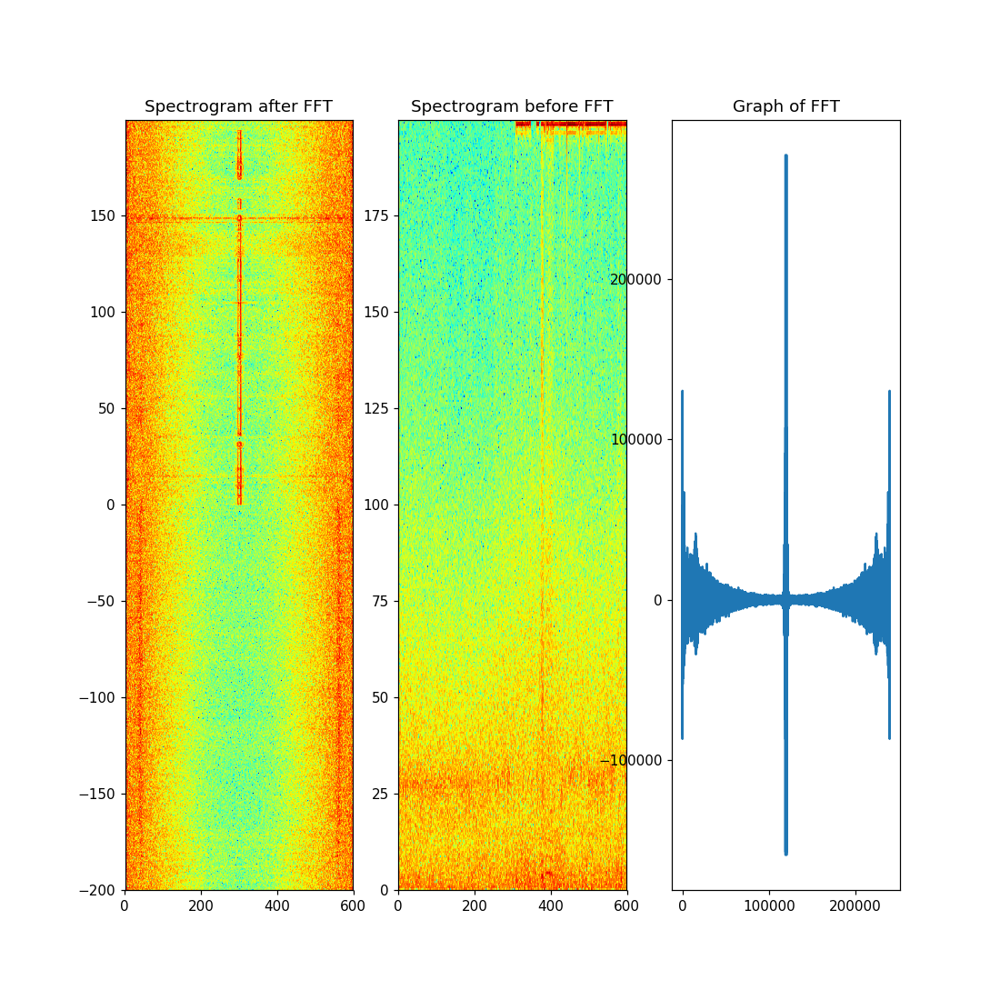

/home/rohan/.virtualenvs/tensorflow/lib/python3.5/site-packages/numpy/core/numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


In [103]:
#Electrode 10
electrode = file[9]
plt.figure(figsize=(10,10))
fft = numpy.fft.fft(electrode)
plt.subplot(131)
Pxx, freqs, bins, im = plt.specgram(fft, NFFT=1024, Fs=399.6097561, noverlap=512, cmap=plt.cm.jet)
plt.title('Spectrogram after FFT')
plt.subplot(132)
plt.title('Spectrogram before FFT')
Pxx, freqs, bins, im = plt.specgram(electrode1, NFFT=1024, Fs=399.6097561, noverlap=512, cmap=plt.cm.jet)
plt.subplot(133)
plt.plot(fft)
plt.title('Graph of FFT')

<IPython.core.display.Javascript object>


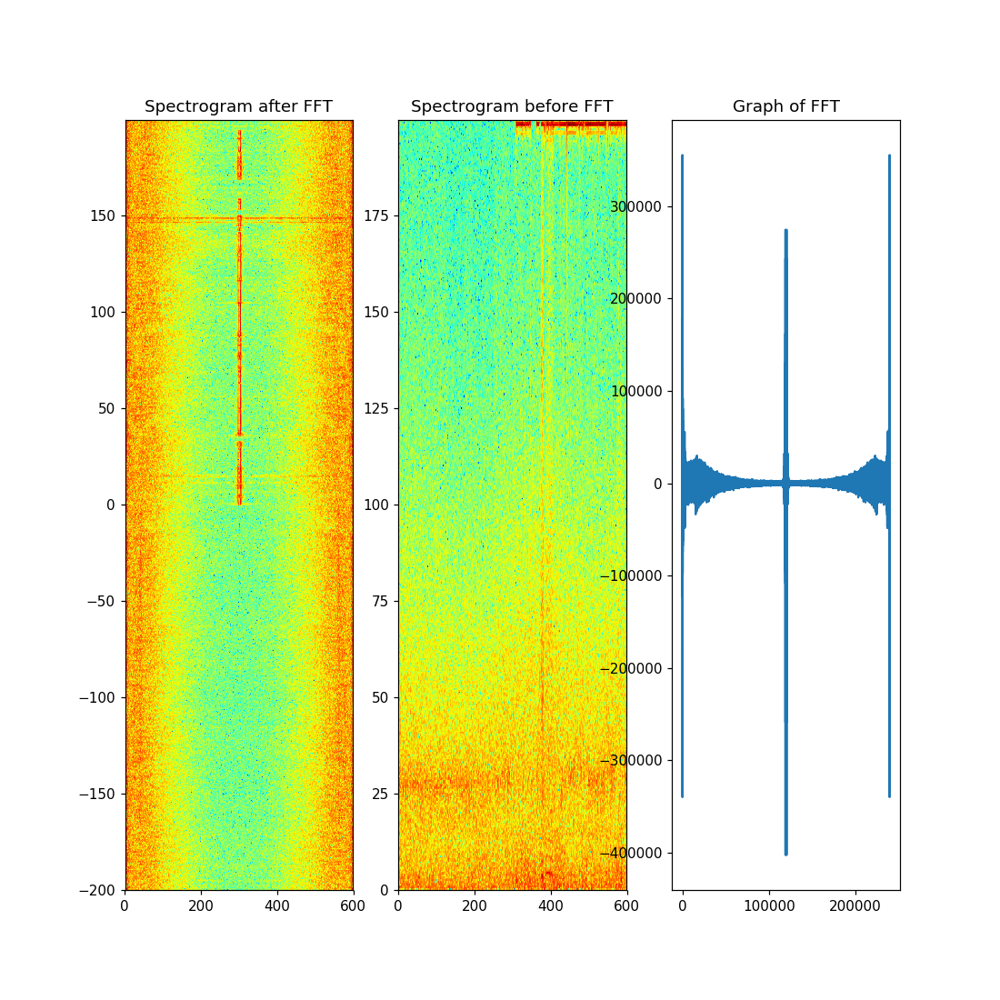

/home/rohan/.virtualenvs/tensorflow/lib/python3.5/site-packages/numpy/core/numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


In [104]:
#Electrode 11
electrode = file[10]
plt.figure(figsize=(10,10))
fft = numpy.fft.fft(electrode)
plt.subplot(131)
Pxx, freqs, bins, im = plt.specgram(fft, NFFT=1024, Fs=399.6097561, noverlap=512, cmap=plt.cm.jet)
plt.title('Spectrogram after FFT')
plt.subplot(132)
plt.title('Spectrogram before FFT')
Pxx, freqs, bins, im = plt.specgram(electrode1, NFFT=1024, Fs=399.6097561, noverlap=512, cmap=plt.cm.jet)
plt.subplot(133)
plt.plot(fft)
plt.title('Graph of FFT')

<IPython.core.display.Javascript object>


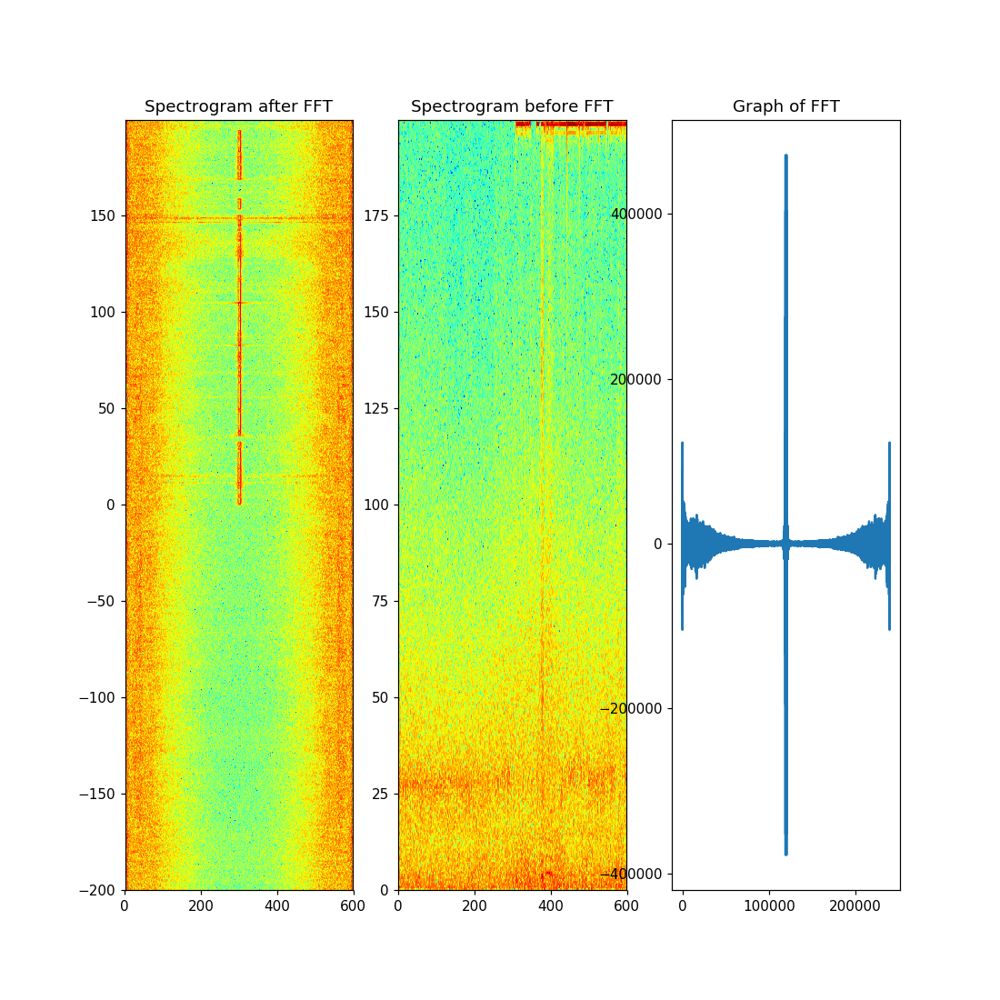

/home/rohan/.virtualenvs/tensorflow/lib/python3.5/site-packages/numpy/core/numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


In [105]:
#Electrode 12
electrode = file[11]
plt.figure(figsize=(10,10))
fft = numpy.fft.fft(electrode)
plt.subplot(131)
Pxx, freqs, bins, im = plt.specgram(fft, NFFT=1024, Fs=399.6097561, noverlap=512, cmap=plt.cm.jet)
plt.title('Spectrogram after FFT')
plt.subplot(132)
plt.title('Spectrogram before FFT')
Pxx, freqs, bins, im = plt.specgram(electrode1, NFFT=1024, Fs=399.6097561, noverlap=512, cmap=plt.cm.jet)
plt.subplot(133)
plt.plot(fft)
plt.title('Graph of FFT')

<IPython.core.display.Javascript object>


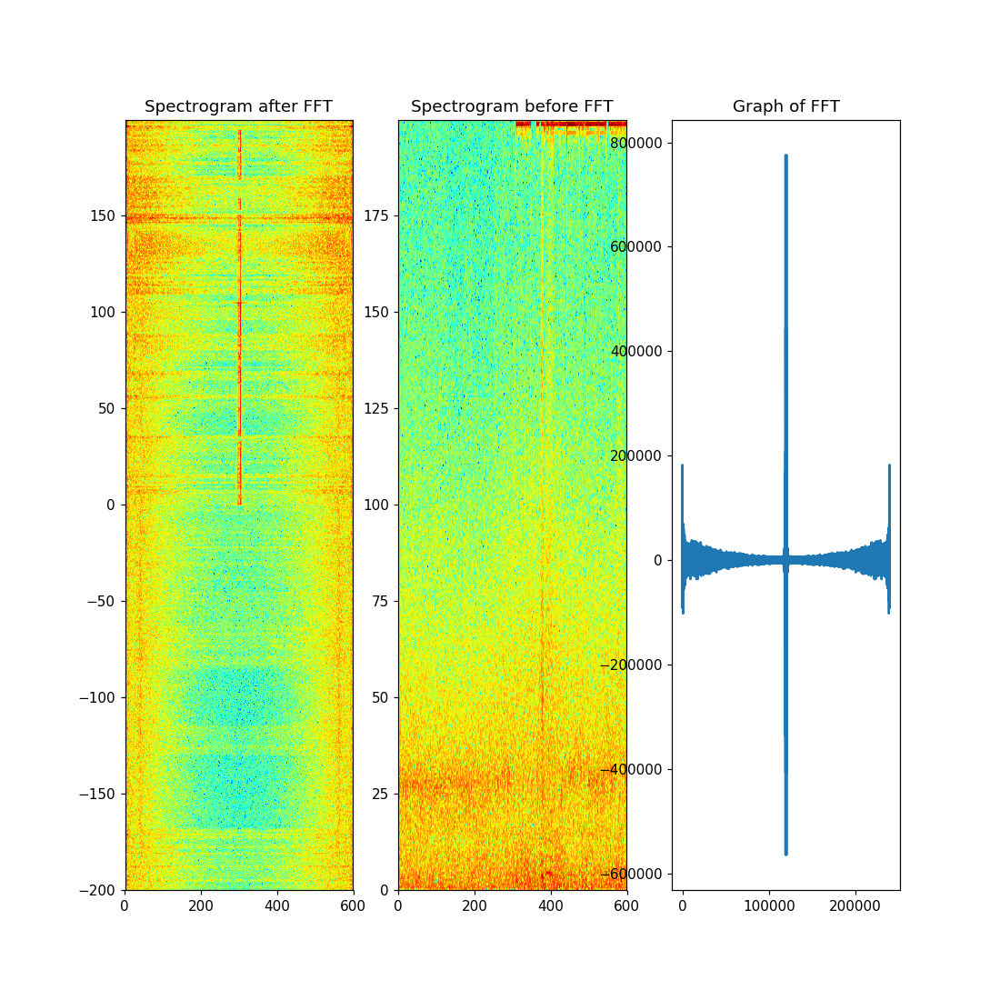

/home/rohan/.virtualenvs/tensorflow/lib/python3.5/site-packages/numpy/core/numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


In [89]:
#Electrode 13
electrode = file[12]
plt.figure(figsize=(10,10))
fft = numpy.fft.fft(electrode)
plt.subplot(131)
Pxx, freqs, bins, im = plt.specgram(fft, NFFT=1024, Fs=399.6097561, noverlap=512, cmap=plt.cm.jet)
plt.title('Spectrogram after FFT')
plt.subplot(132)
plt.title('Spectrogram before FFT')
Pxx, freqs, bins, im = plt.specgram(electrode1, NFFT=1024, Fs=399.6097561, noverlap=512, cmap=plt.cm.jet)
plt.subplot(133)
plt.plot(fft)
plt.title('Graph of FFT')

<IPython.core.display.Javascript object>


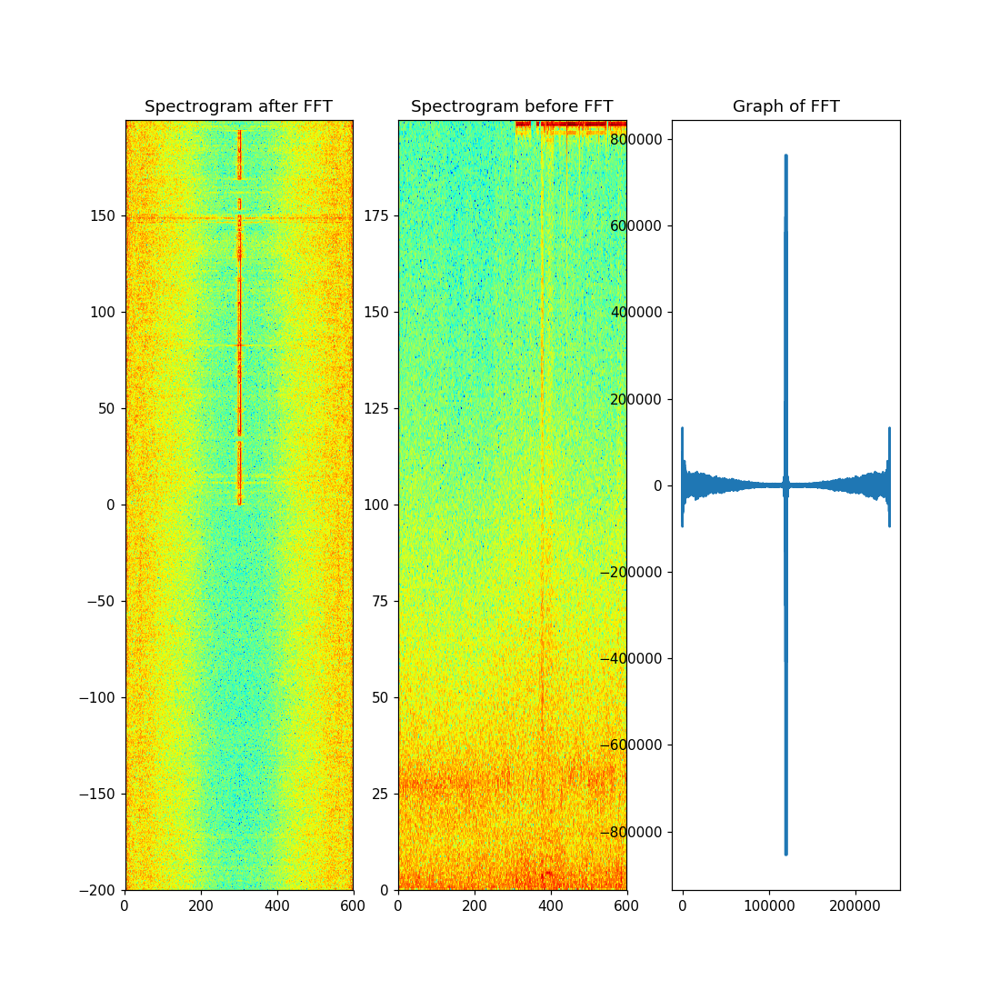

/home/rohan/.virtualenvs/tensorflow/lib/python3.5/site-packages/numpy/core/numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


In [92]:
#Electrode 14
electrode = file[13]
plt.figure(figsize=(10,10))
fft = numpy.fft.fft(electrode)
plt.subplot(131)
Pxx, freqs, bins, im = plt.specgram(fft, NFFT=1024, Fs=399.6097561, noverlap=512, cmap=plt.cm.jet)
plt.title('Spectrogram after FFT')
plt.subplot(132)
plt.title('Spectrogram before FFT')
Pxx, freqs, bins, im = plt.specgram(electrode1, NFFT=1024, Fs=399.6097561, noverlap=512, cmap=plt.cm.jet)
plt.subplot(133)
plt.plot(fft)
plt.title('Graph of FFT')

<IPython.core.display.Javascript object>


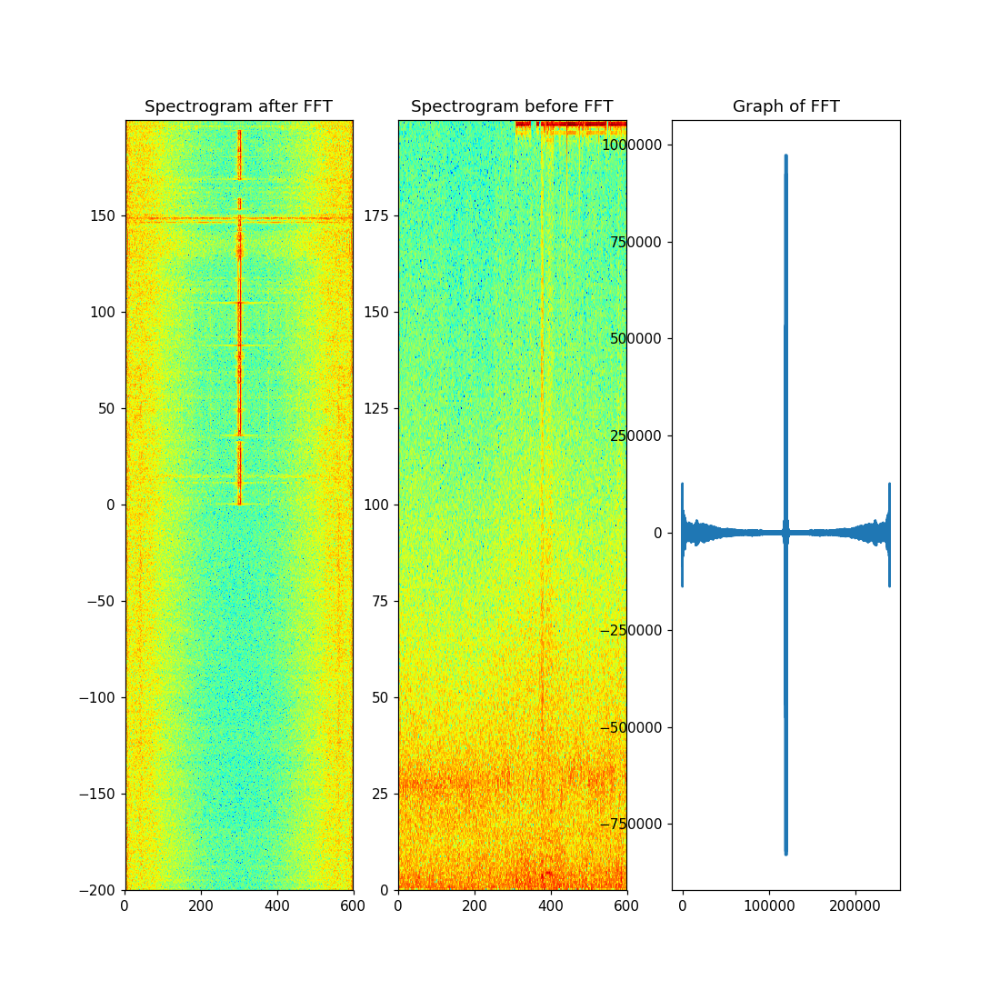

/home/rohan/.virtualenvs/tensorflow/lib/python3.5/site-packages/numpy/core/numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


In [91]:
#Electrode 15
electrode = file[14]
plt.figure(figsize=(10,10))
fft = numpy.fft.fft(electrode)
plt.subplot(131)
Pxx, freqs, bins, im = plt.specgram(fft, NFFT=1024, Fs=399.6097561, noverlap=512, cmap=plt.cm.jet)
plt.title('Spectrogram after FFT')
plt.subplot(132)
plt.title('Spectrogram before FFT')
Pxx, freqs, bins, im = plt.specgram(electrode1, NFFT=1024, Fs=399.6097561, noverlap=512, cmap=plt.cm.jet)
plt.subplot(133)
plt.plot(fft)
plt.title('Graph of FFT')

<IPython.core.display.Javascript object>


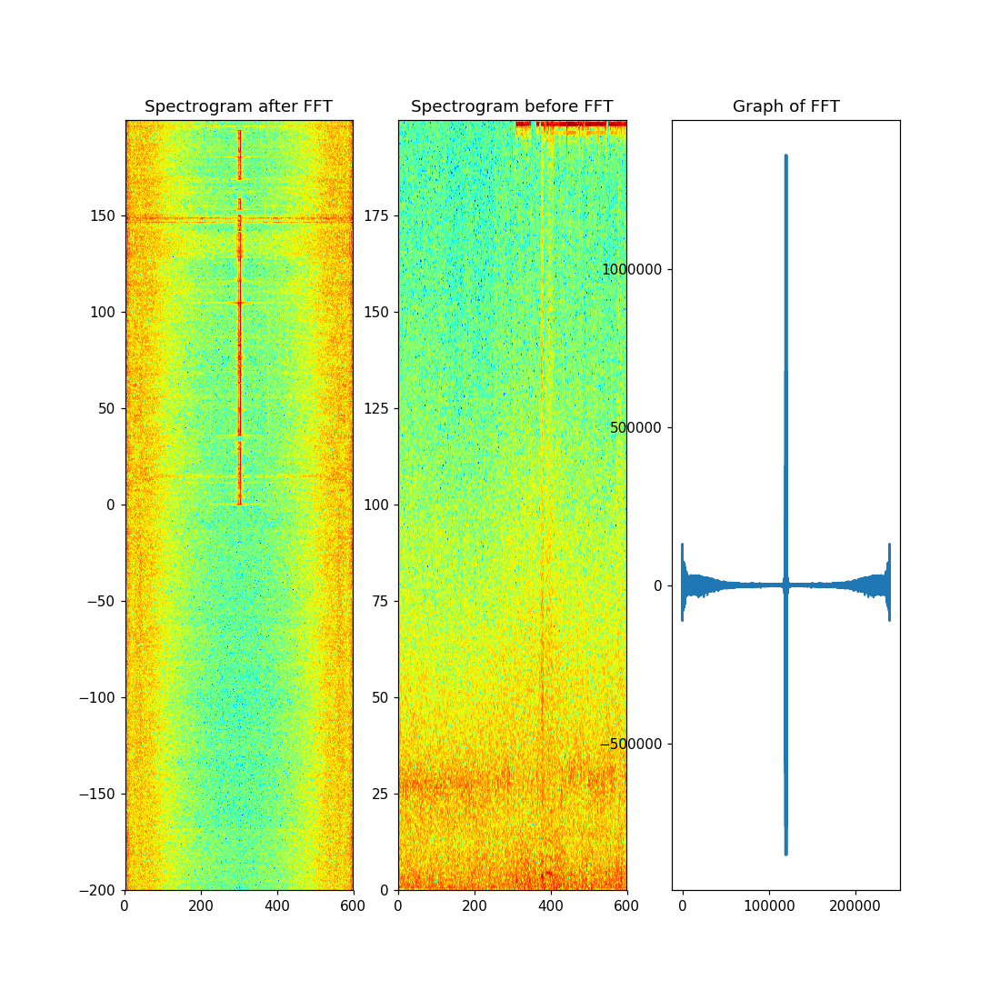

/home/rohan/.virtualenvs/tensorflow/lib/python3.5/site-packages/numpy/core/numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


In [90]:
#Electrode 16
electrode = file[15]
plt.figure(figsize=(10,10))
fft = numpy.fft.fft(electrode)
plt.subplot(131)
Pxx, freqs, bins, im = plt.specgram(fft, NFFT=1024, Fs=399.6097561, noverlap=512, cmap=plt.cm.jet)
plt.title('Spectrogram after FFT')
plt.subplot(132)
plt.title('Spectrogram before FFT')
Pxx, freqs, bins, im = plt.specgram(electrode1, NFFT=1024, Fs=399.6097561, noverlap=512, cmap=plt.cm.jet)
plt.subplot(133)
plt.plot(fft)
plt.title('Graph of FFT')